# Neutrophil exploration

In [2]:
import scanpy as sc
import pandas as pd

import matplotlib.pyplot as plt

import seaborn as sns

import squidpy as sq

import celltypist
from celltypist import models

from matplotlib import rcParams

In [3]:
adata = sc.read_h5ad("h5ad/xenium5k_scVI.h5ad")

In [4]:
adata

AnnData object with n_obs × n_vars = 646121 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob

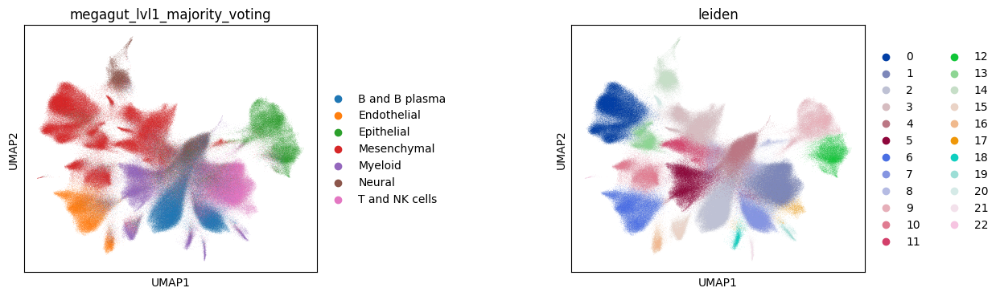

In [5]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata,
    color=[
        "megagut_lvl1_majority_voting", "leiden"
    ],
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

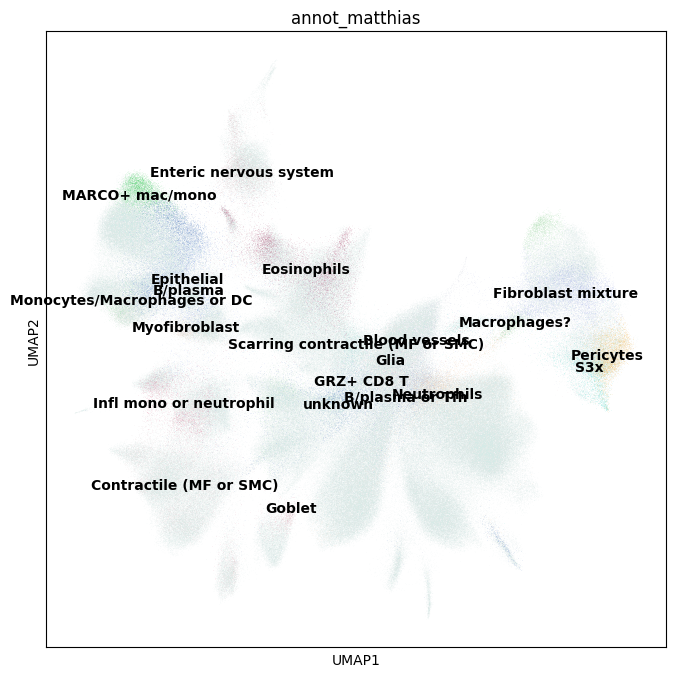

In [6]:
rcParams["figure.figsize"] = (8, 8)

sc.pl.umap(
    adata,
    color=[
        "annot_matthias"
    ],
    wspace=0.7,
    legend_loc="on data",
    palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

In [7]:
#adata.obs.annot_matthias.value_counts()

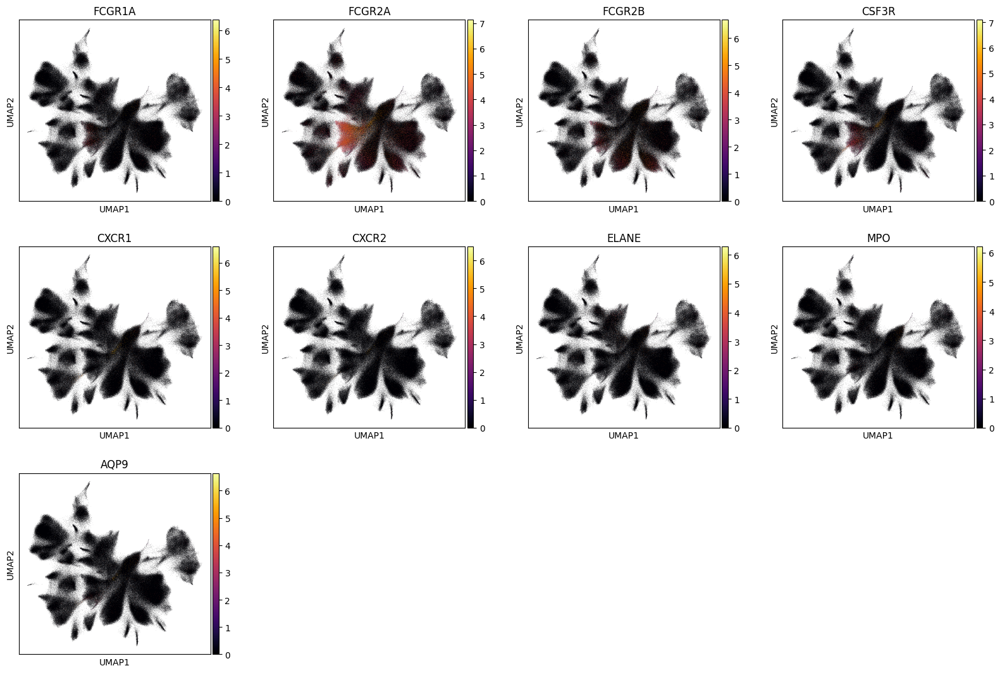

In [8]:
# Neutrophil markers from Matthias
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata,
    color=[
#        "S100A8",
#        "S100A9",
        "FCGR1A",
#        "FCGR1BP",
        "FCGR2A",
        "FCGR2B",
        "CSF3R",
        "CXCR1",
        "CXCR2",
        "ELANE",
        "MPO",       
        "AQP9"
    ],
    cmap="inferno"
)

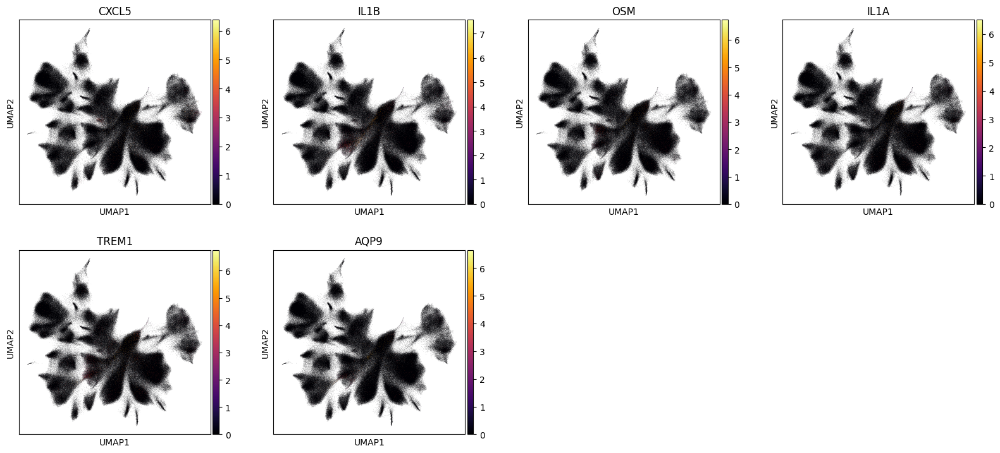

In [38]:
# more neutrophil markers
# Neutrophil markers from Matthias
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata,
    color=[
        "CXCL5",
        "IL1B",
        "OSM",
        "IL1A",
#        "S100A8",
        "TREM1",
        "AQP9",
#        "IL1R2",
#        "S100A12"
    ],
    cmap="inferno"
)

# Neutrophils?
According to Matthias's annotation

In [ ]:
adata

In [ ]:
adata.obs.annot_matthias.value_counts()

In [14]:
adata_sub = adata[adata.obs.annot_matthias.isin(['Neutrophils', 'Infl mono or neutrophil'])]

In [15]:
adata_sub

View of AnnData object with n_obs × n_vars = 11035 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S

In [18]:
sc.pp.neighbors(adata_sub, use_rep="X_scVI")

In [19]:
# UMAP
sc.tl.umap(adata_sub)

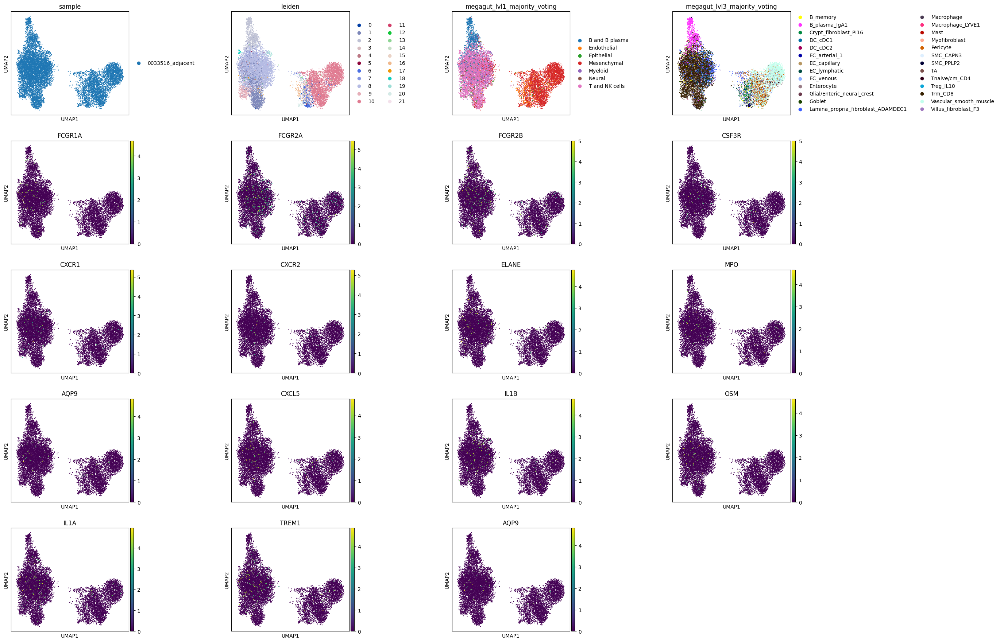

In [21]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_sub,
    color=[
        "sample", "leiden", "megagut_lvl1_majority_voting", "megagut_lvl3_majority_voting",
        "FCGR1A",
        "FCGR2A",
        "FCGR2B",
        "CSF3R",
        "CXCR1",
        "CXCR2",
        "ELANE",
        "MPO", "AQP9",
        
        "CXCL5",
        "IL1B",
        "OSM",
        "IL1A",
#        "S100A8",
        "TREM1",
        "AQP9",
#        "IL1R2",
#        "S100A12"
    ], 
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

# Cluster 2 guess

In [22]:
adata

AnnData object with n_obs × n_vars = 646121 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob

In [28]:
# Formating
adata.obs.sample = adata.obs['sample']

In [29]:
adata.obs.sample.value_counts()

sample
0043587_affected    240888
0033516_affected    239286
0033516_adjacent    121661
0043587_adjacent     44286
Name: count, dtype: int64

In [33]:
adata_sub = adata[(adata.obs.graphclust == '2') & (adata.obs.sample == '0043587_affected')]

In [34]:
adata_sub

View of AnnData object with n_obs × n_vars = 10541 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S

In [35]:
sc.pp.neighbors(adata_sub, use_rep="X_scVI")

In [36]:
# UMAP
sc.tl.umap(adata_sub)

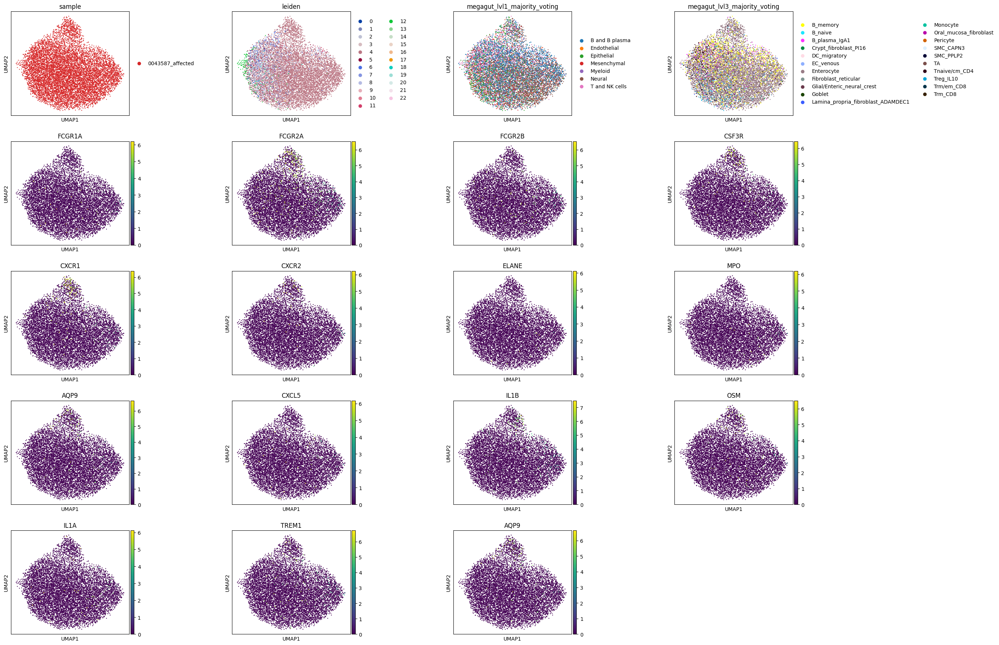

In [37]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_sub,
    color=[
        "sample", "leiden", "megagut_lvl1_majority_voting", "megagut_lvl3_majority_voting",
        "FCGR1A",
        "FCGR2A",
        "FCGR2B",
        "CSF3R",
        "CXCR1",
        "CXCR2",
        "ELANE",
        "MPO", "AQP9",
        
        "CXCL5",
        "IL1B",
        "OSM",
        "IL1A",
#        "S100A8",
        "TREM1",
        "AQP9",
#        "IL1R2",
#        "S100A12"
    ], 
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

# Myeloid subset

In [39]:
adata_sub = adata[adata.obs.megagut_lvl1_majority_voting == 'Myeloid']

In [40]:
adata_sub

View of AnnData object with n_obs × n_vars = 60678 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S

In [41]:
# exclude_cells = ["Enterocyte", "Lamina_propria_fibroblast_ADAMDEC1", "B_memory", "Tnaive/cm_CD4", "Trm_CD8", "Goblet", "Crypt_fibroblast_PI16", "Myofibroblast", "Trm_Th17", "Trm/em_CD8"]

# adata_sub = adata_sub[~adata_sub.obs.megagut_lvl3_majority_voting.isin(exclude_cells)]

In [42]:
adata_sub

View of AnnData object with n_obs × n_vars = 60678 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S

In [43]:
sc.pp.neighbors(adata_sub, use_rep="X_scVI")

In [44]:
# UMAP
sc.tl.umap(adata_sub)

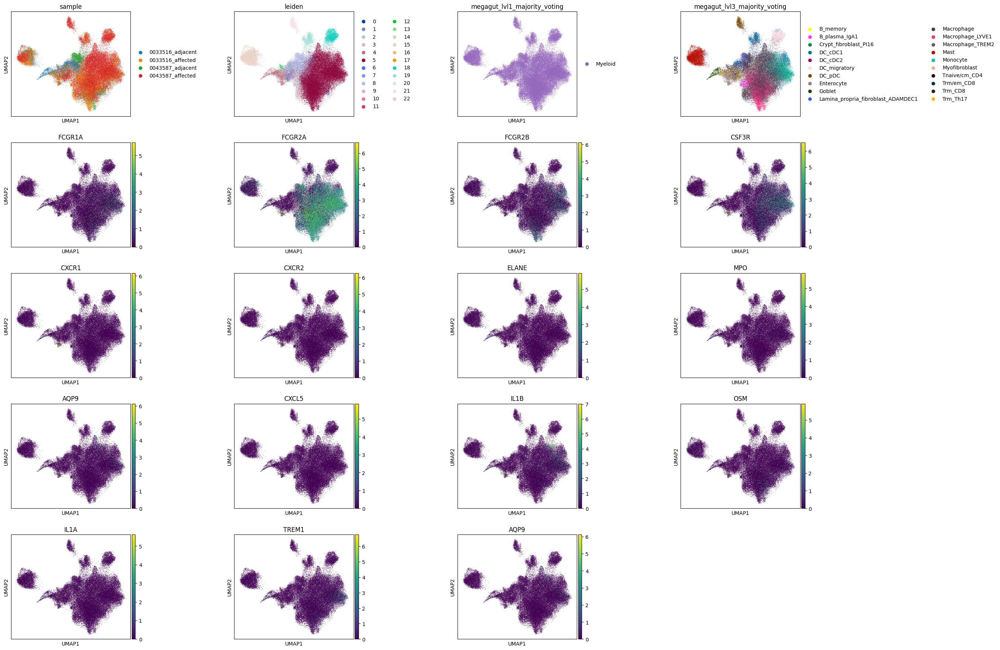

In [45]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_sub,
    color=[
        "sample", "leiden", "megagut_lvl1_majority_voting", "megagut_lvl3_majority_voting",
        "FCGR1A",
        "FCGR2A",
        "FCGR2B",
        "CSF3R",
        "CXCR1",
        "CXCR2",
        "ELANE",
        "MPO",
        "AQP9",
         "CXCL5",
        "IL1B",
        "OSM",
        "IL1A",
#        "S100A8",
        "TREM1",
        "AQP9",
#        "IL1R2",
#        "S100A12"
], 
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

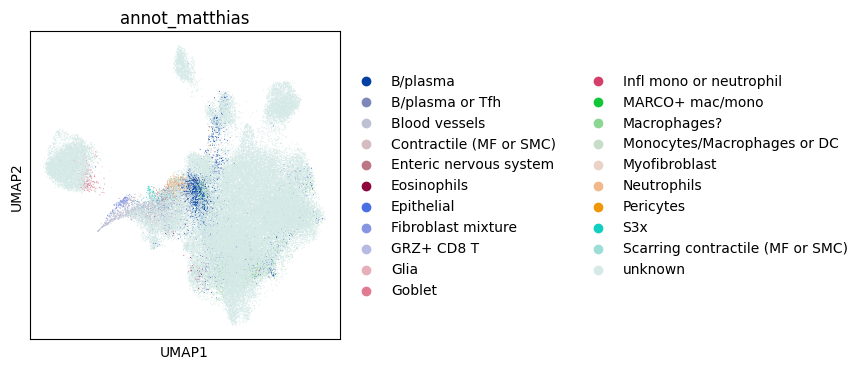

In [26]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_sub,
    color=[
        "annot_matthias"
    ], 
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

# T and NK cells

In [27]:
adata_sub = adata[adata.obs.megagut_lvl1_majority_voting == 'T and NK cells']

In [28]:
adata_sub

View of AnnData object with n_obs × n_vars = 107029 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', '

In [29]:
adata_sub.obs.annot_matthias.value_counts()

annot_matthias
unknown                             95431
Neutrophils                          4778
B/plasma or Tfh                      2090
Blood vessels                        1177
B/plasma                              891
Scarring contractile (MF or SMC)      621
Macrophages?                          480
Goblet                                407
S3x                                   284
Contractile (MF or SMC)               230
Glia                                  212
GRZ+ CD8 T                            132
Fibroblast mixture                     93
Epithelial                             65
Enteric nervous system                 48
Infl mono or neutrophil                36
Myofibroblast                          27
Eosinophils                            24
Pericytes                               3
Name: count, dtype: int64

In [30]:
adata_sub.obs.megagut_lvl3_majority_voting.value_counts()

megagut_lvl3_majority_voting
Trm/em_CD8                            37406
Treg_IL10                             16115
B_memory                              14045
Trm_CD8                               12534
Enterocyte                             7852
Tnaive/cm_CD4                          7526
Tfh                                    4614
Trm_Th17                               4560
Lamina_propria_fibroblast_ADAMDEC1     1334
Fibroblast_reticular                    493
B_plasma_IgA1                           291
B_naive                                 131
Myofibroblast                           128
Name: count, dtype: int64

In [31]:
# exclude_cells = ["Enterocyte", "Lamina_propria_fibroblast_ADAMDEC1", "B_memory", "Tnaive/cm_CD4", "Trm_CD8", "Goblet", "Crypt_fibroblast_PI16", "Myofibroblast", "Trm_Th17", "Trm/em_CD8"]

# adata_sub = adata_sub[~adata_sub.obs.megagut_lvl3_majority_voting.isin(exclude_cells)]

In [32]:
adata_sub

View of AnnData object with n_obs × n_vars = 107029 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', '

In [33]:
sc.pp.neighbors(adata_sub, use_rep="X_scVI")

In [34]:
# UMAP
sc.tl.umap(adata_sub)

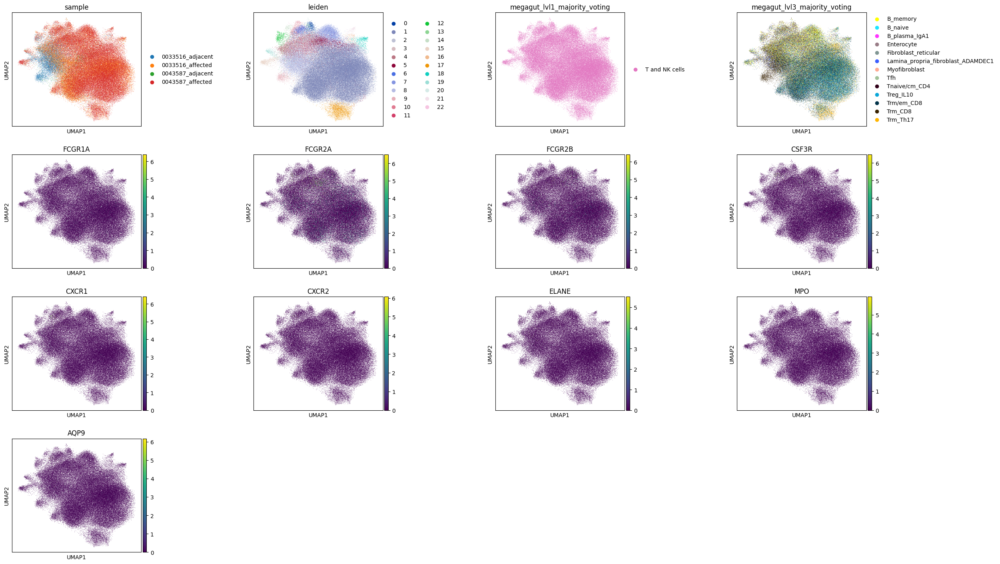

In [35]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_sub,
    color=[
        "sample", "leiden", "megagut_lvl1_majority_voting", "megagut_lvl3_majority_voting",
        "FCGR1A",
        "FCGR2A",
        "FCGR2B",
        "CSF3R",
        "CXCR1",
        "CXCR2",
        "ELANE",
        "MPO", "AQP9",
    ], 
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

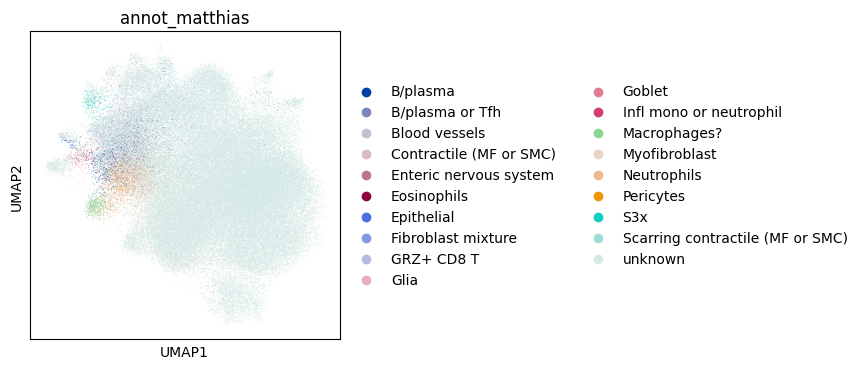

In [36]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_sub,
    color=[
        "annot_matthias"
    ], 
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)